In [1]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 

In [2]:
def printImgs(images,lsNames,lsValPSNR, n=1, m=1, title='',k=0):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    i=0
    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax.set_title(lsName)
        if i>k:
            ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)
        i=i+1    
    plt.savefig(title)    
    plt.show()
    
def printAng(images,lsNames,lsValPSNR, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )

    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(image)
        ax.set_title(lsName)
        ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)   
    plt.savefig(title)    
    plt.show()


def printGrafs(images, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(18, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    for ax, image in zip(axs.flat, images):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.savefig(title)    
    plt.show()

In [3]:
### DIP - VTV - GradRimm - Dirac
lsNumPrue = ['400B','390','400C','392B']
lambAsLS = ['0','0.01','0.003','0.01']
typeP = 'den25'

kodim_num_i = 19

In [4]:
lsBestImg = []
    
ruta = './IMGkodim'+ str(kodim_num_i) +'/'

#original
namefig = './denoising/kodim'+ str(kodim_num_i) + '.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
#filename = ruta + 'kodim'+ str(kodim_num_i) +'.png'
#cv2.imwrite(filename, imgOut)

#denoisig25
namefig = './noisy_25/noisy_25_kodim'+ str(kodim_num_i) + '.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
#filename = ruta + 'noisy_25_kodim'+ str(kodim_num_i) + '.png'
#cv2.imwrite(filename, imgOut)

for Nprueb,lambAs in zip(lsNumPrue,lambAsLS):
    ls = []
    ruta = './'+ Nprueb +'/BestPnsr'+ typeP + '_P'+ Nprueb +'lamb'+ lambAs +'/'
    namefig = ruta + 'BestPnsr'+ typeP +'_P'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'.png'
    imgOut = cv2.imread(namefig)
    lsBestImg.append(imgOut)
    
    filename = ruta + 'BestIMGP'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'.png'
    cv2.imwrite(filename, imgOut)

In [5]:
lsNames = ['Original','Noisy','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

In [6]:
#lsValPSNR = [' ','20.321','28,247','29,111','29,306','29,400']

from skimage.metrics import peak_signal_noise_ratio as compare_psnr

lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

/home/linux21/miniconda3/lib/python3.10/site-packages/skimage/metrics/simple_metrics.py:163: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


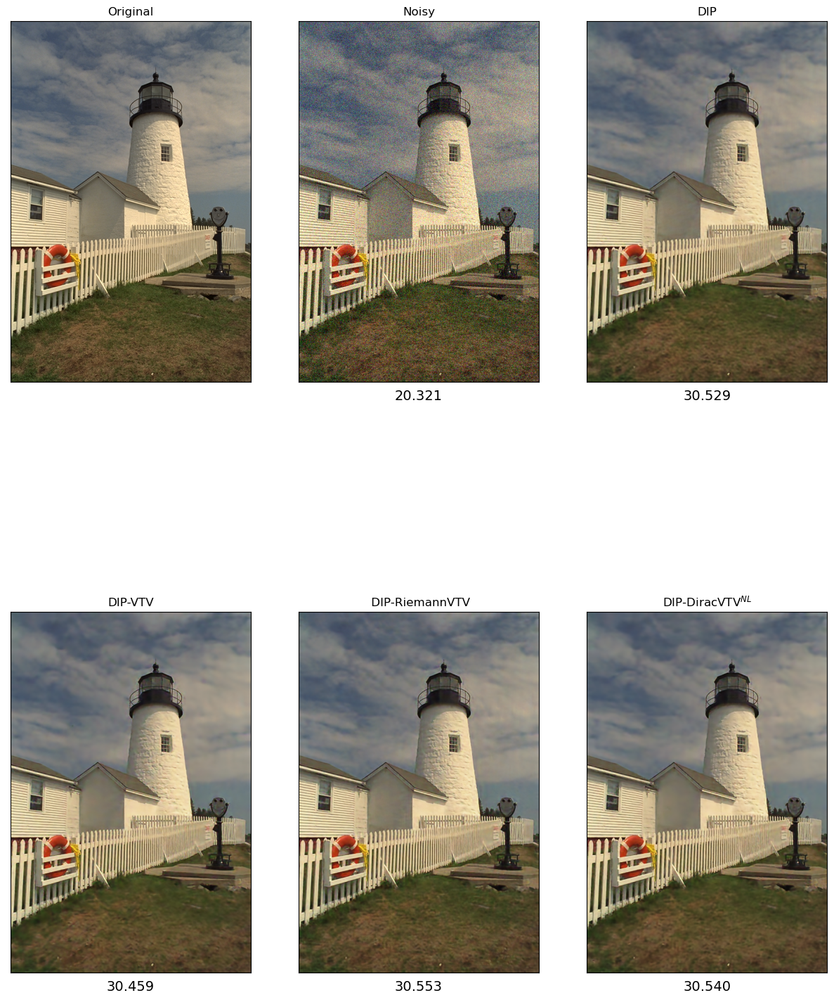

In [7]:
titulo = 'ComImg'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsBestImg,lsNames,lsValPSNR, 2, 3, titulo)

In [8]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [9]:
(a_y,a_x) = (280,100)
(b_y,b_x) = (380,200)
(c_y,c_x) = (350,380)
(d_y,d_x) = (450,470)

In [10]:
lsImgRec =[]
lscrtG =[]
lscrtR =[]
for i in range(len(lsBestImg)):
    imgRec=lsBestImg[i].copy()
    rec1=cv2.rectangle(imgRec,(a_y,a_x),(b_y,b_x),(0,255,0),2)
    rec2=cv2.rectangle(imgRec,(c_y,c_x),(d_y,d_x),(0,0,255),2)
    lsImgRec.append(imgRec)
    
    cort1G = imgRec[a_x+1:b_x,a_y+1:b_y,:].copy()
    lscrtG.append(cort1G)
    cort1R = imgRec[c_x+1:d_x,c_y+1:d_y,:].copy()
    lscrtR.append(cort1R)

In [11]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.321082956903282, 30.528697389709386, 30.458732580457916, 30.553362333776604, 30.540479955491367]
30.553362333776604
4


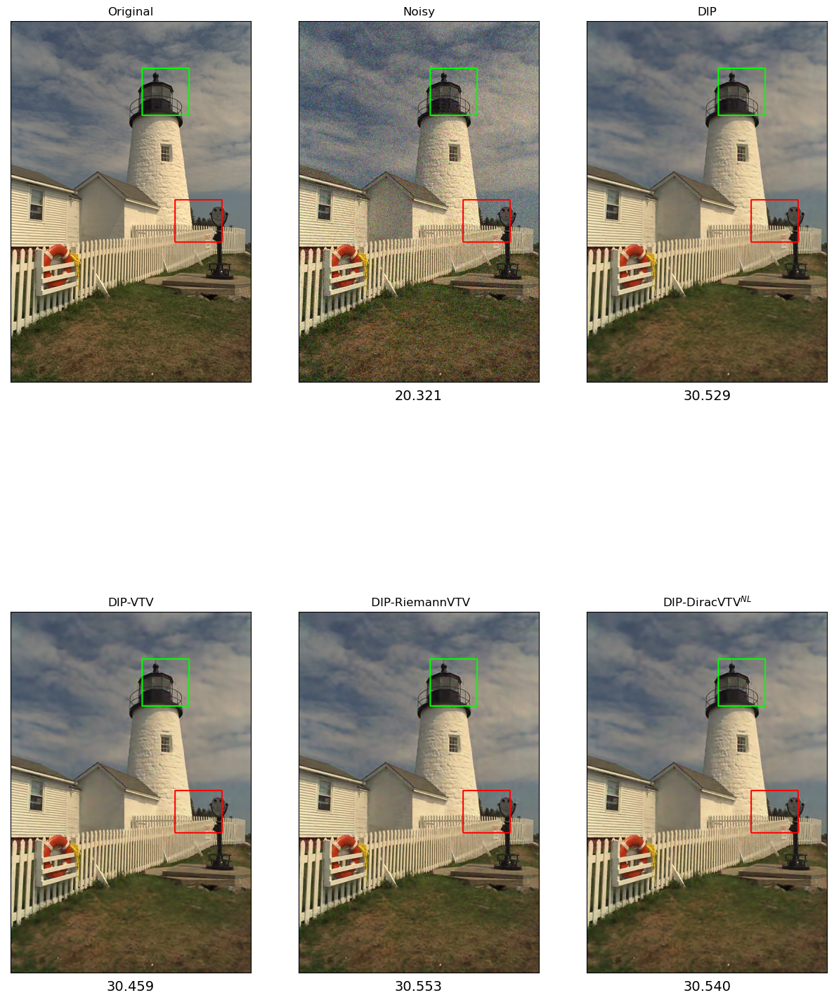

In [12]:
titulo = 'ComImgREC'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsImgRec,lsNames,lsValPSNR, 2, 3, titulo)

In [13]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtG[0],lscrtG[i])
    lsValPSNR.append(val)
    

In [14]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.616689980167102, 31.32288314753, 31.384556423210206, 31.341871856476637, 31.654270831689352]
31.654270831689352
5


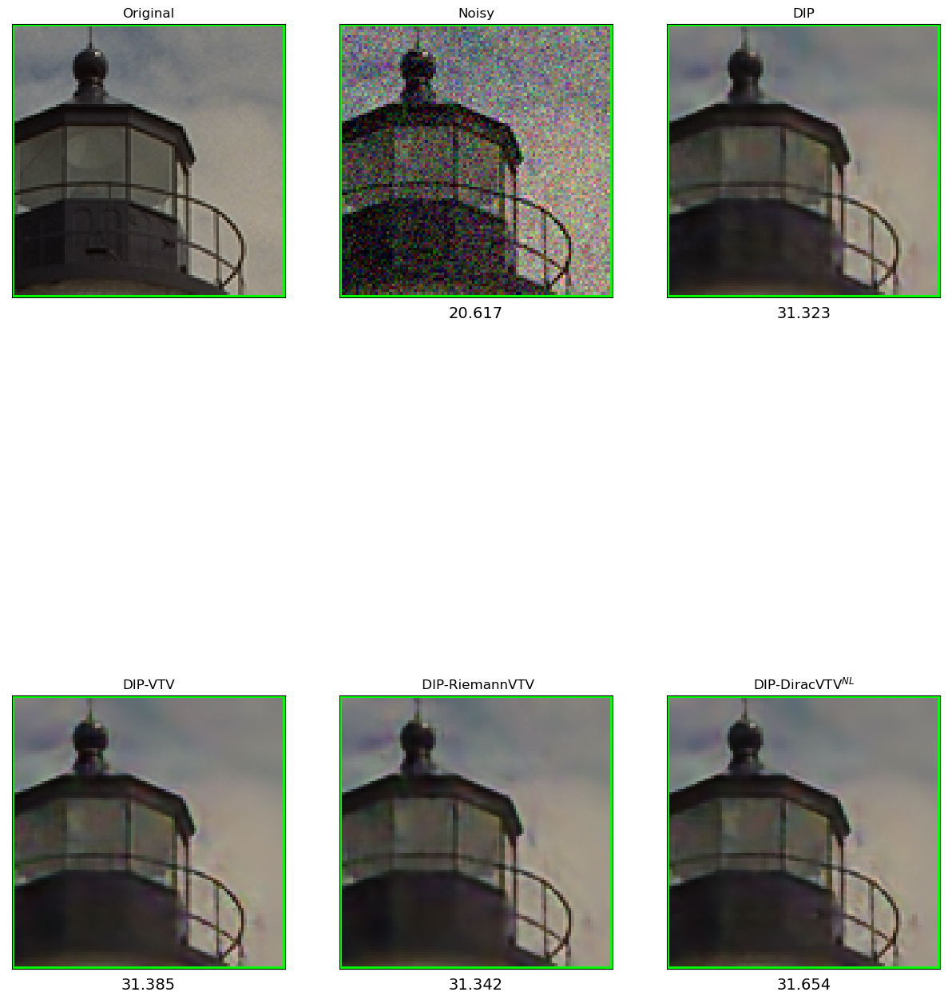

In [15]:
titulo = 'ComImgRectG'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtG,lsNames,lsValPSNR, 2, 3, titulo)

In [16]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtR[0],lscrtR[i])
    lsValPSNR.append(val)

In [17]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.638921652719247, 28.423693625186452, 28.422301807196018, 28.423129463380306, 28.63468328926523]
28.63468328926523
5


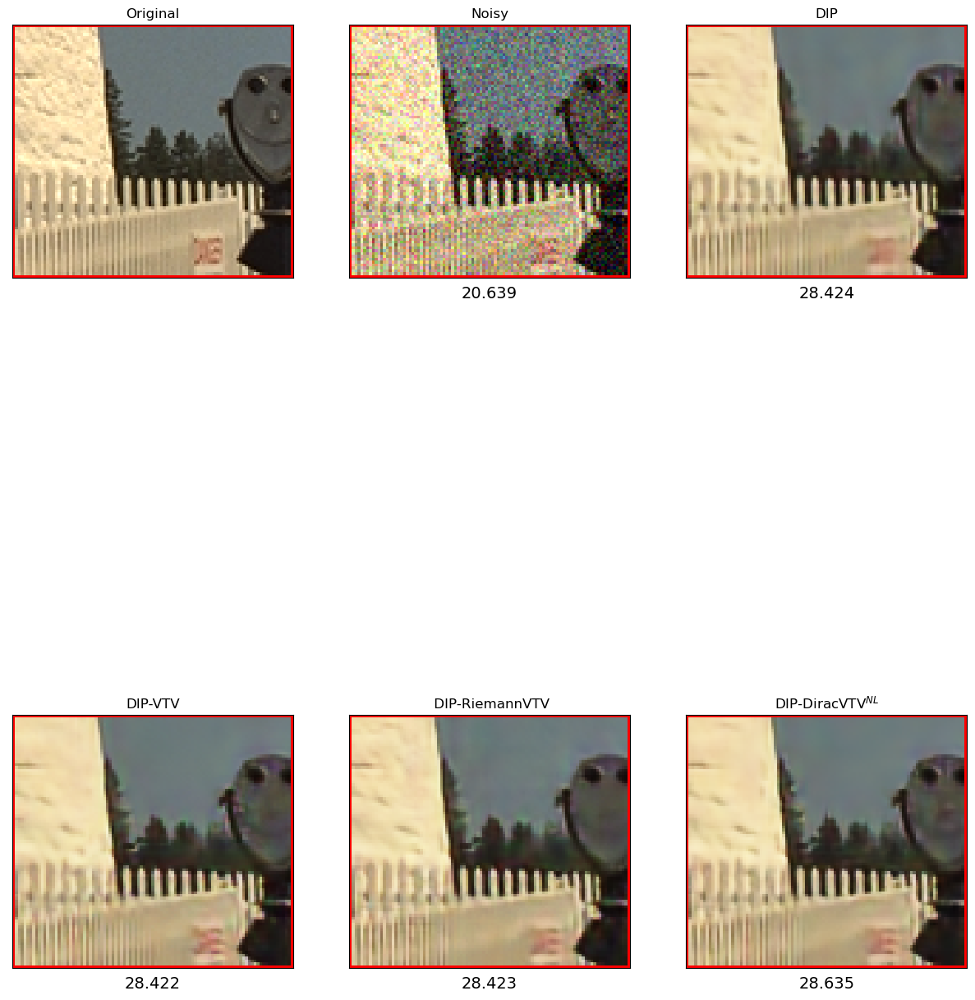

In [18]:
titulo = 'ComImgRectR'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtR,lsNames,lsValPSNR, 2, 3, titulo)

In [19]:
np.shape(lscrtG[0])

(99, 99, 3)

In [20]:
imgIN = lscrtG[0]

In [21]:
def calcularAng(imgIN):

    color = [(255,0,0),(0,255,0),(0,0,255)]
    pares=[[0,1]]#,[0,2],[1,2]]
    
    
    imgObj = imgIN.copy()
    derX = imgObj[:,:-1,:].astype(int) - imgObj[:,1:,:].astype(int)
    derY = imgObj[:-1,:,:].astype(int) - imgObj[1:,:,:].astype(int)
    
    
    ##Orillas, coincidir dimensiones
    derX=derX[1:-1,:-1,:]
    derY=derY[:-1,1:-1,:]
    n,m,C = np.shape(derX)
    print('shape',n,m,C)
    
    normT = np.sqrt(derX**2 + derY**2)
    
    #Calcular productos
    prodBG = derX[:,:,0]*derX[:,:,1] + derY[:,:,0]*derY[:,:,1]
    prodBR = derX[:,:,0]*derX[:,:,2] + derY[:,:,0]*derY[:,:,2]
    prodGR = derX[:,:,1]*derX[:,:,2] + derY[:,:,1]*derY[:,:,2]
    
    #Calcular normas
    normBG = normT[:,:,0]*normT[:,:,1]
    normBR = normT[:,:,0]*normT[:,:,2]
    normGR = normT[:,:,1]*normT[:,:,2]
    
    lsProd = [prodBG,prodBR,prodGR]
    lsNorm = [normBG,normBR,normGR]
    
    cout=0
    ban=0
    
    imgANG= np.zeros((n,m))
    true=0
    for i in range(n):
        for j in range(m):
            
            lsAng=[]
            promPX=0
            
            #Angulos de cada canal
            for k in range(C):
                matProd=lsProd[k]
                prod = matProd[i][j]
                matNorm = lsNorm[k]
                norm = matNorm[i][j]
                #print('norm=',norm)           
                
                if(norm!=0):
                    arg = prod/norm
                    
                    if(abs(arg)>=1):
                        ang=0
                        #print('ang0',ang)
                    else:
                        ang=math.acos(arg)
                        #if(ban==1):
                            #print('arg',arg)
                            #print('angAcos',ang)
                            #ban=0
                    #if(prod<0):#Angulo obtuso
                        #cout+=1
                        #print('prod ij',prod,i,j)
                        #ban=1
                        #ang=np.pi-ang
                    #print('ang',ang)
                else:
                    ang=0
                    
                promPX+=ang
            
            promPX=np.mean(promPX)
            #print('promPX',promPX)
            
            imgANG[i][j]=promPX
    
    #print('contador',cout)
    #print('true',true)
    
    return imgANG

In [22]:
imgANG = calcularAng(lscrtG[0])

shape 97 97 3


In [23]:
imgANG

array([[0.00000000e+00, 6.22043667e+00, 6.09485505e+00, ...,
        0.00000000e+00, 6.18974780e+00, 6.26972985e+00],
       [6.18970037e+00, 9.27295218e-01, 1.41725254e+00, ...,
        1.59659971e-01, 0.00000000e+00, 0.00000000e+00],
       [6.19240805e+00, 1.08083900e+00, 0.00000000e+00, ...,
        2.48709989e-01, 1.03829223e+00, 0.00000000e+00],
       ...,
       [6.28318531e+00, 5.32504098e-01, 0.00000000e+00, ...,
        0.00000000e+00, 4.06888787e+00, 7.37391805e-01],
       [5.32628785e+00, 5.48334902e-01, 2.02206743e-01, ...,
        2.49809154e+00, 7.97044891e-01, 5.12302765e-01],
       [6.28318531e+00, 0.00000000e+00, 6.32202728e-08, ...,
        9.27295239e-01, 3.59707000e-01, 1.28700222e+00]])

In [24]:
imgANG[0,:]

array([0.        , 6.22043667, 6.09485505, 6.14040905, 0.        ,
       0.        , 6.25193785, 6.28318531, 6.25143994, 6.1124689 ,
       6.19147748, 6.1689365 , 5.99991517, 6.18870884, 6.26816621,
       6.23592116, 6.26898507, 6.25150553, 6.23691494, 6.19047012,
       6.19053641, 6.23725991, 6.2197265 , 6.25227531, 6.190304  ,
       6.25333678, 5.90376984, 5.07921906, 5.03309529, 6.16253449,
       6.27426215, 0.        , 6.23828987, 0.        , 6.23854882,
       6.25006646, 6.18613433, 6.12823398, 6.2390723 , 6.16115748,
       6.20893764, 6.24860905, 6.25217093, 0.        , 6.23546837,
       6.24237465, 6.15948518, 6.23801209, 6.26651903, 6.27121664,
       6.25195109, 6.14312266, 6.22195149, 6.22226849, 3.14159265,
       6.15758005, 6.25178976, 6.25177429, 6.26679223, 6.15649501,
       6.28318531, 6.25205706, 6.20480845, 3.14159265, 6.15611597,
       6.25165862, 6.28318531, 6.25175492, 6.14077654, 0.        ,
       6.23630736, 6.23441449, 6.15724269, 6.15711784, 6.22018

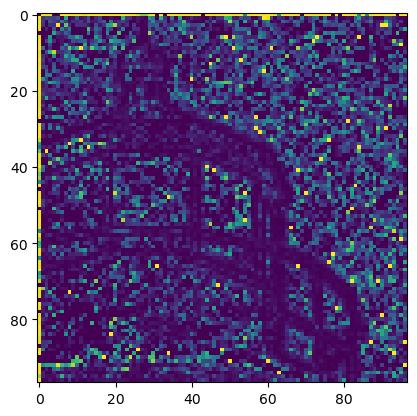

In [25]:
plt.imshow(imgANG)#,'gray')
title= 'parche'+ kodim_num_i + '.png'
plt.savefig(title)  

In [26]:
np.mean(imgANG)

0.9265148302462044

shape 766 510 3
shape 766 510 3
shape 766 510 3
shape 766 510 3
shape 766 510 3
shape 766 510 3


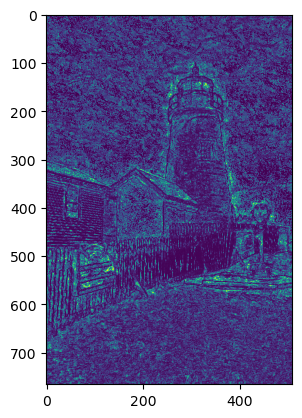

In [27]:
lsImgAng=[]
lsAngProm=[]

for img in lsBestImg:#lscrtG:
    imgOut = calcularAng(img)
    lsImgAng.append(imgOut)
    prom=np.mean(imgOut)
    lsAngProm.append(prom)
    plt.imshow(imgOut)

In [28]:
lsAngProm

[0.8094188414638156,
 4.326296130422171,
 1.4720739737773487,
 1.590843435602959,
 1.4340216830350287,
 1.0430766752745724]

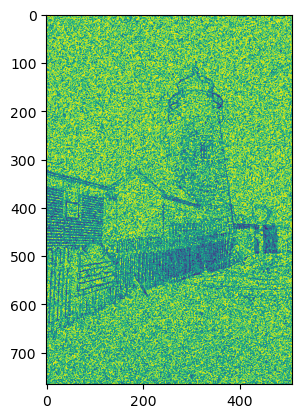

In [29]:
plt.imshow(lsImgAng[1])

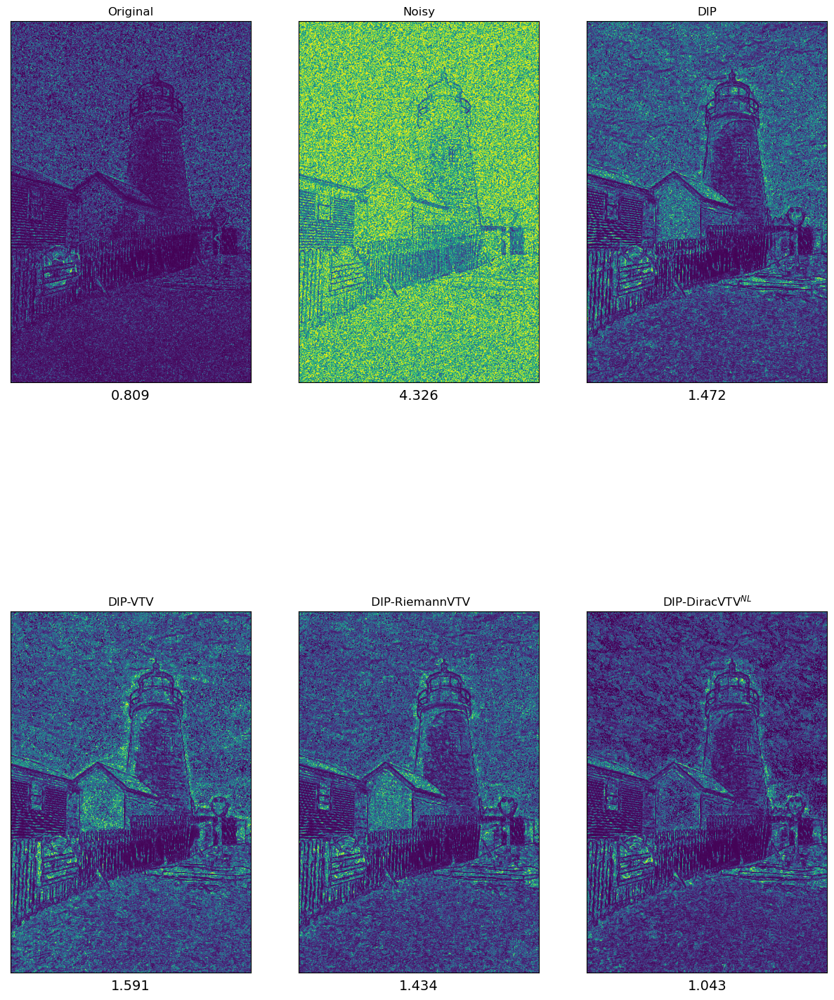

In [30]:
titulo = 'ImgAng'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printAng(lsImgAng,lsNames,lsAngProm, 2, 3, titulo)

In [31]:
def printVect(i,j,lsBestImg):
    lsImgVec = []

    color = [(255,0,0),(0,255,0),(0,0,255)]
    fact=70

    for imgParche in lsBestImg:

        imgObj = imgParche.copy()
        derX = imgObj[:,:-1,:].astype(int) - imgObj[:,1:,:].astype(int)
        derY = imgObj[:-1,:,:].astype(int) - imgObj[1:,:,:].astype(int)

        for k in range(3):
            capa = k

            (v1,v2) = (derX[i,j,capa],derY[i,j,capa])
            norm = np.sqrt(v1**2+v2**2)
            (v1u,v2u) = (fact*v1//norm,fact*v2//norm)
            imgOut = cv2.arrowedLine(imgObj, (j,i), (int(j+v2u),int(i+v1u)), color[k], 4,  cv2.LINE_AA)#, 0, 0.5)#cv2.LINE_4)#
            print((i, j), (int(i+v1u), int(j+v2u)))

        lsImgVec.append(imgObj)
    return lsImgVec

In [32]:
lsImgVec = printVect(550,430,lsBestImg)
#lsImgVec = printVect(234,191,lsImgVec)

(550, 430) (550, 500)
(550, 430) (543, 499)
(550, 430) (569, 497)
(550, 430) (596, 482)
(550, 430) (619, 433)
(550, 430) (520, 493)
(550, 430) (561, 499)
(550, 430) (572, 496)
(550, 430) (550, 500)
(550, 430) (544, 499)
(550, 430) (527, 496)
(550, 430) (561, 499)
(550, 430) (570, 496)
(550, 430) (610, 464)
(550, 430) (588, 488)
(550, 430) (555, 499)
(550, 430) (599, 479)
(550, 430) (572, 496)


In [33]:
lsImgVec = lsBestImg.copy()

In [34]:
import random
DICT = [(550,430),(355, 164),(152, 341)]#(352, 485), (144, 296) #kodim 17
#DICT = [(163,120),(196, 62),(231, 196), (291, 156)] #Kodim19

ls = []
for i in range(6):
    x = random.randint(0, 766)
    y = random.randint(0, 510)
    ls.append((x,y))
print(ls)
for (x,y) in DICT:
    lsImgVec = printVect(x,y,lsImgVec)

[(347, 80), (664, 410), (104, 294), (718, 448), (94, 331), (600, 144)]
(550, 430) (550, 500)
(550, 430) (543, 499)
(550, 430) (569, 497)
(550, 430) (596, 482)
(550, 430) (619, 433)
(550, 430) (520, 493)
(550, 430) (561, 499)
(550, 430) (572, 496)
(550, 430) (550, 500)
(550, 430) (544, 499)
(550, 430) (527, 496)
(550, 430) (561, 499)
(550, 430) (570, 496)
(550, 430) (610, 464)
(550, 430) (588, 488)
(550, 430) (555, 499)
(550, 430) (599, 479)
(550, 430) (572, 496)
(355, 164) (290, 138)
(355, 164) (285, 164)
(355, 164) (285, 164)
(355, 164) (300, 120)
(355, 164) (294, 128)
(355, 164) (288, 141)
(355, 164) (341, 95)
(355, 164) (355, 94)
(355, 164) (313, 108)
(355, 164) (386, 101)
(355, 164) (338, 96)
(355, 164) (355, 94)
(355, 164) (355, 94)
(355, 164) (355, 94)
(355, 164) (292, 132)
(355, 164) (313, 108)
(355, 164) (310, 110)
(355, 164) (313, 108)
(152, 341) (222, 341)
(152, 341) (222, 341)
(152, 341) (222, 341)
(152, 341) (216, 369)
(152, 341) (221, 342)
(152, 341) (155, 271)
(152, 341) 

In [35]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [36]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.321082956903282, 30.528697389709386, 30.458732580457916, 30.553362333776604, 30.540479955491367]
30.553362333776604
4


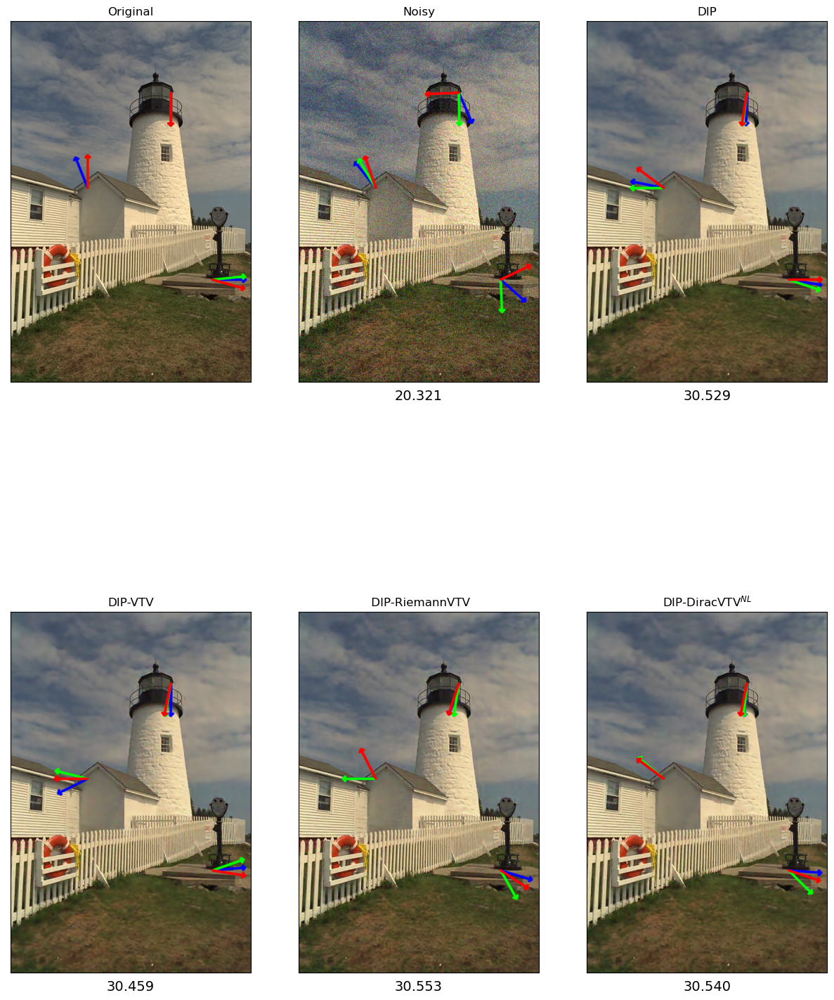

In [37]:
titulo = 'ComImgVect'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

#printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 4, titulo)
printImgs(lsImgVec,lsNames,lsValPSNR, 2, 3, titulo)

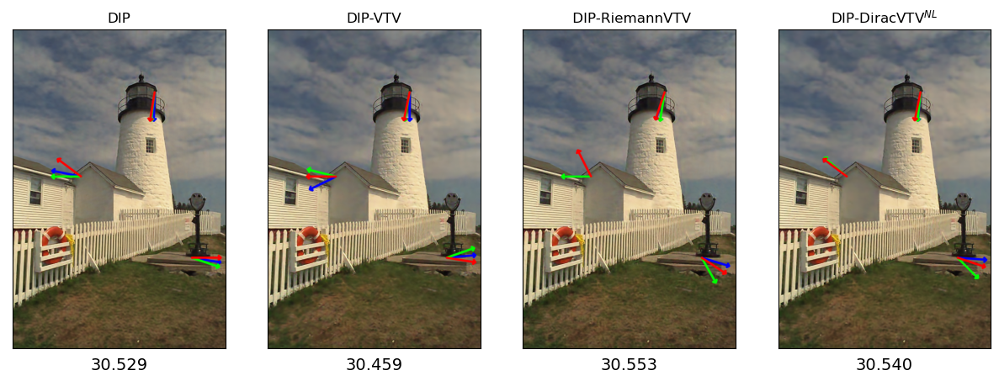

In [38]:
titulo = 'ComImgVectRedu'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 4, titulo,-1)

In [39]:
[(152, 341), (144, 296), (239, 433), (214, 203), (270, 60), ]

[(152, 341), (144, 296), (239, 433), (214, 203), (270, 60)]

In [40]:
imgDIP = lsBestImg[2].copy()

In [41]:
imgDIP.shape

(768, 512, 3)

In [42]:
derX = imgDIP[:,:-1,:] - imgDIP[:,1:,:]
derY = imgDIP[:-1,:,:] - imgDIP[1:,:,:]

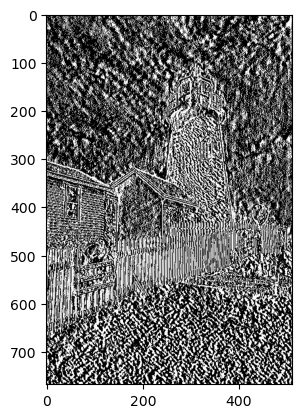

In [43]:
plt.imshow(derX[:,:,0], 'gray')

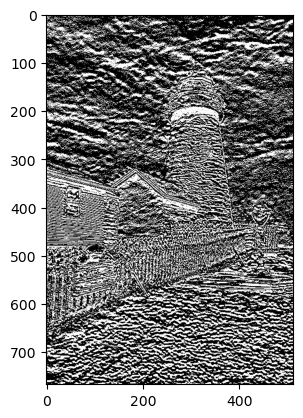

In [44]:
plt.imshow(derY[:,:,0], 'gray')

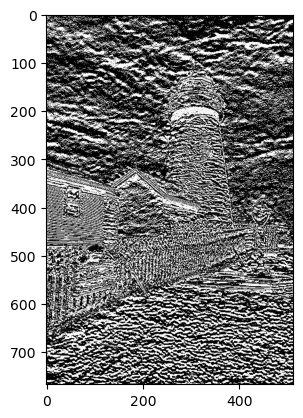

In [45]:
plt.imshow(derY[:,:,0]+derY[:,:,0], 'gray')

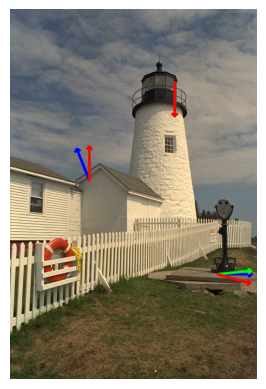

In [46]:
namefig = 'GradidentesImagenOrg'+  str(kodim_num_i) + '.png'
plt.imshow(cv2.cvtColor(lsImgVec[0], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.savefig(namefig)

In [49]:
lsAngProm.insert(0,kodim_num_i)

In [50]:
lsAngProm

[19,
 0.8094188414638156,
 4.326296130422171,
 1.4720739737773487,
 1.590843435602959,
 1.4340216830350287,
 1.0430766752745724]

In [53]:
datAng = np.array(lsAngProm)
fname = 'lsAngProm'+ typeP +'.csv'
np.savetxt(fname, datAng, delimiter =",",fmt ='% s')